In [1]:
import os

import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import simplstyles
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper
from results import get_result_path

In [2]:
plt.style.use('nord-light-talk')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [5]:
subject = 5
modality = "listening"
low_level_feature = "powspec"

In [6]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
flatmap_mask = load_hdf5_array(mapper_path, key='flatmap_mask')

# Load EV

In [57]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80875.000000
mean,0.042628
std,0.094548
min,-0.352895
25%,-0.020599
50%,0.034369
75%,0.096462
max,0.628782


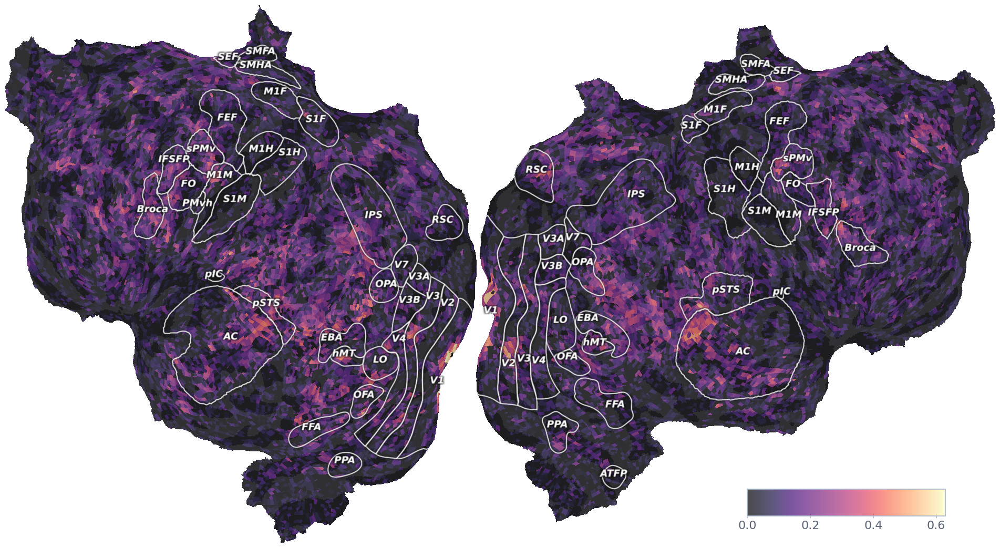

In [8]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Variance Partitioning

## Low Level Prediction

In [58]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [59]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/reading/subject01/moten_scores.csv


,correlation_score,r2_score,p_value
count,80875.000000,81133.000000,8.087500e+04
mean,0.016485,-0.001032,4.192083e-01
std,0.082826,0.018726,3.082247e-01
min,-0.486410,-0.179133,8.852759e-52
25%,-0.035443,-0.001413,1.322819e-01
50%,0.014011,0.000000,3.863645e-01
75%,0.064710,0.000784,6.850884e-01
max,0.740372,0.546319,9.999963e-01


In [60]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

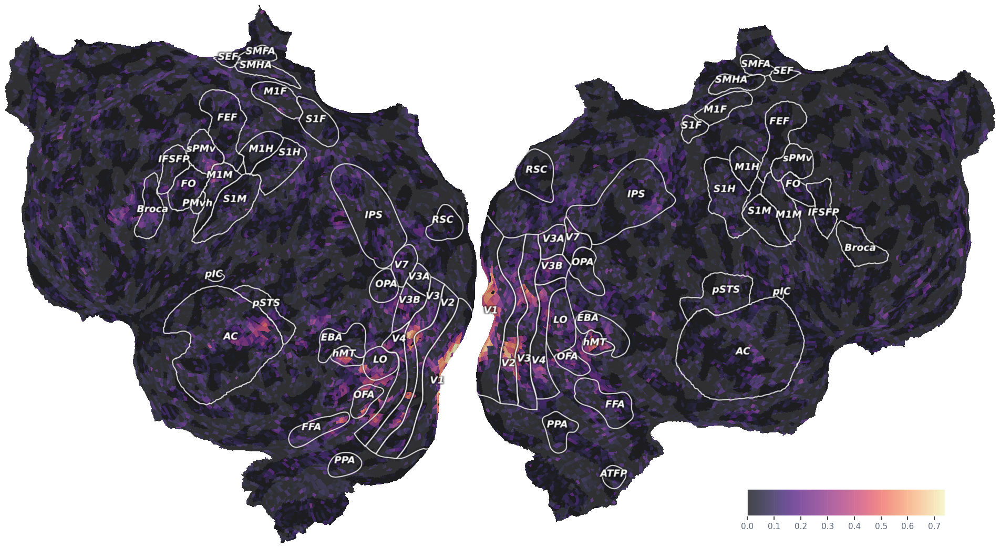

In [61]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [62]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [63]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80875.000000,8.113300e+04,8.087500e+04
mean,0.059019,6.869162e-03,3.437352e-01
std,0.100092,2.310119e-02,3.157145e-01
min,-0.284116,-1.415885e-01,3.867543e-31
25%,-0.008113,-2.384186e-07,4.121012e-02
50%,0.048185,1.192093e-07,2.625231e-01
75%,0.113290,5.365193e-03,6.059684e-01
max,0.610741,3.649375e-01,9.999760e-01


In [15]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

0.6212625183260996


<Axes: >

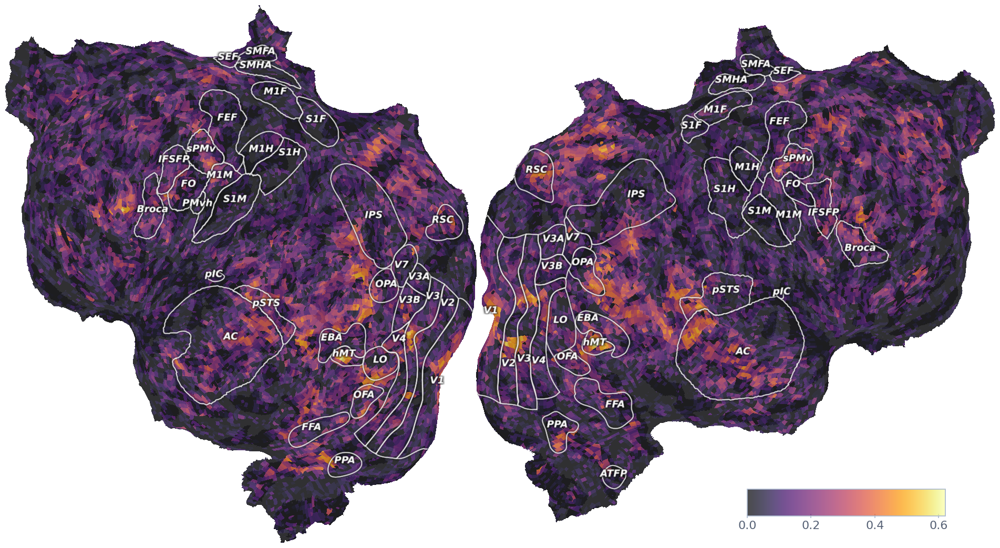

In [16]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05])


## Joint Prediction

In [17]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [18]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80875.000000,8.113300e+04,8.087500e+04
mean,0.053307,5.241303e-03,3.554043e-01
std,0.104679,2.971092e-02,3.169987e-01
min,-0.493036,-2.267736e-01,3.129484e-48
25%,-0.014411,-2.748966e-03,4.797564e-02
50%,0.040711,1.192093e-07,2.822463e-01
75%,0.106203,6.369770e-03,6.237557e-01
max,0.722458,5.194275e-01,9.999799e-01


In [19]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

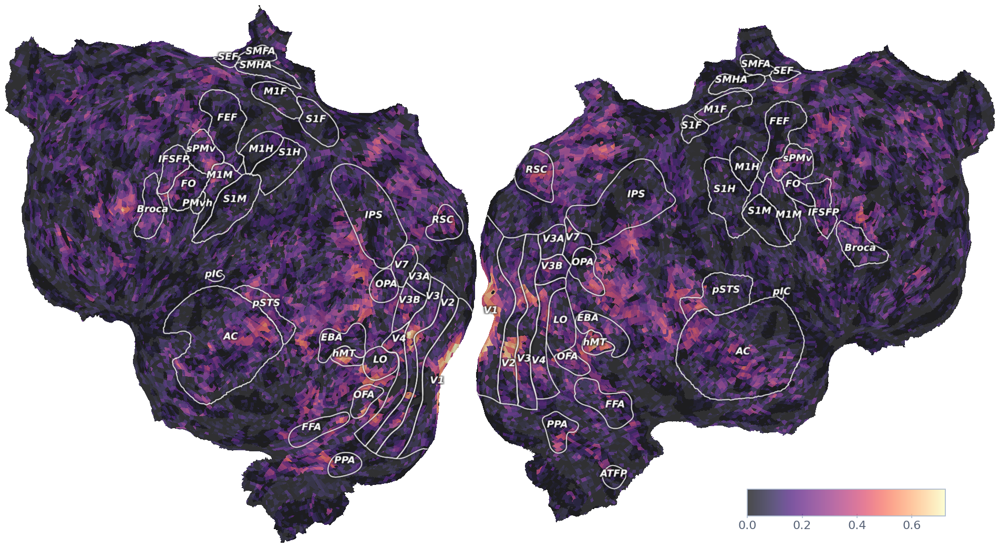

In [20]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

In [21]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [22]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic\moten,joint\moten,semantic\moten_r2,joint\moten_r2
count,80875.000000,80875.000000,81133.000000,81133.000000
mean,0.041869,0.041869,0.000627,0.006493
std,0.094652,0.094652,0.012616,0.022847
min,-0.269636,-0.269636,-0.188246,-0.173684
25%,-0.022712,-0.022712,-0.002151,-0.000672
50%,0.030002,0.030002,0.000000,0.000268
75%,0.087355,0.087355,0.001975,0.007482
max,0.558956,0.558956,0.261096,0.331720


In [23]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level

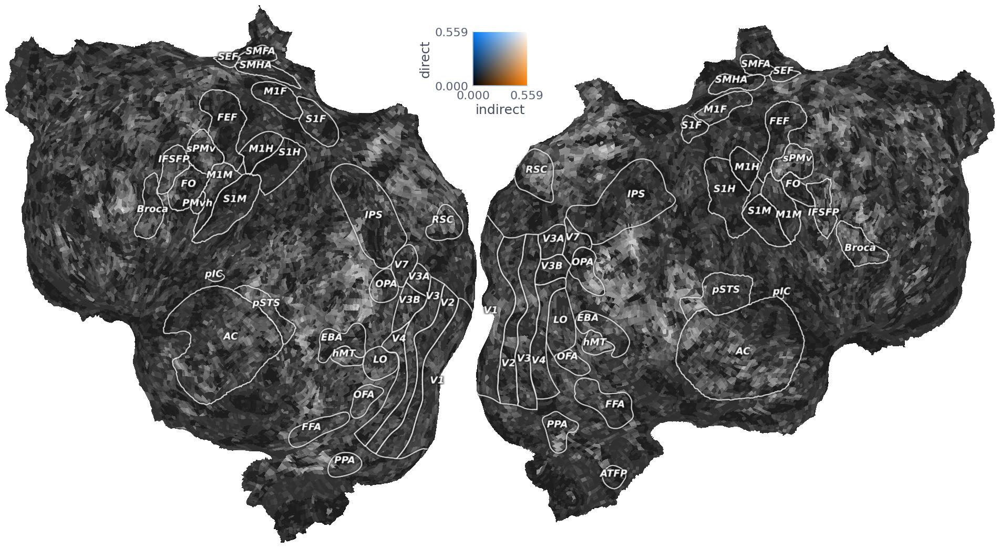

In [24]:
indirect = vp_scores[f'semantic\\{low_level_feature}']
direct = vp_scores[f'joint\\{low_level_feature}']
vmax = max(indirect.max(), direct.max())

plot_2d_flatmap_from_mapper(indirect, direct, mapper_path, vmin=0, vmin2=0, vmax=vmax, vmax2=vmax, label_1="indirect",
                            label_2='direct')
plt.show()

# Residual Method

In [25]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")

In [26]:
r2_scores = pd.read_csv(cross_path)

<Axes: ylabel='Count'>

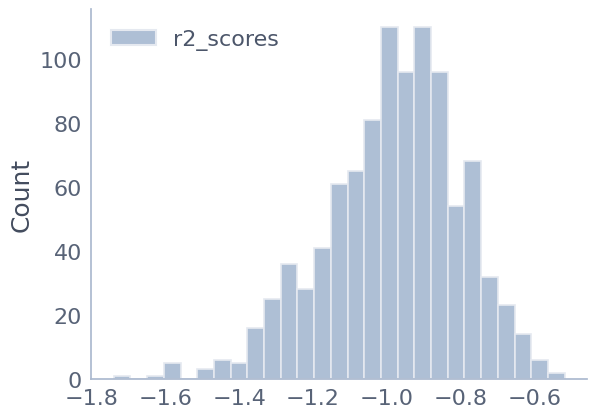

In [27]:
sns.histplot(r2_scores)

In [28]:
cross_ridge_path = os.path.join(get_result_path(modality, subject),
                                f"cross_ridge_{low_level_feature}_english1000_scores.csv")

<Axes: ylabel='Count'>

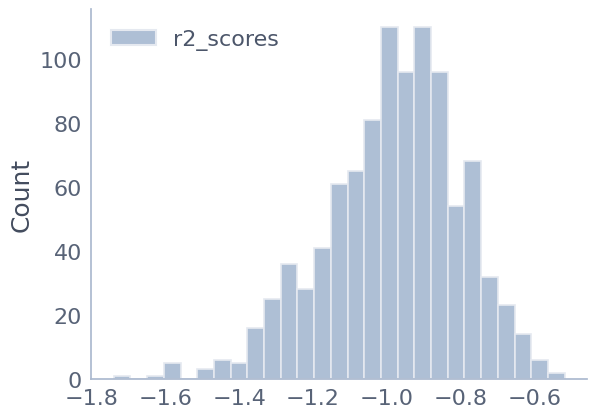

In [29]:
r2_scores = pd.read_csv(cross_path)
sns.histplot(r2_scores)

## Residuals

### OLS

In [30]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [31]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,81133.000000,80875.000000,81133.000000,8.087500e+04
mean,40566.000000,0.030434,-0.008651,4.086539e-01
std,23421.224032,0.081929,0.031843,3.118177e-01
min,0.000000,-0.269544,-0.454701,5.970715e-19
25%,20283.000000,-0.025305,-0.007229,1.125847e-01
50%,40566.000000,0.023849,0.000000,3.740706e-01
75%,60849.000000,0.078594,0.000002,6.772125e-01
max,81132.000000,0.489628,0.142805,9.999585e-01


In [32]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

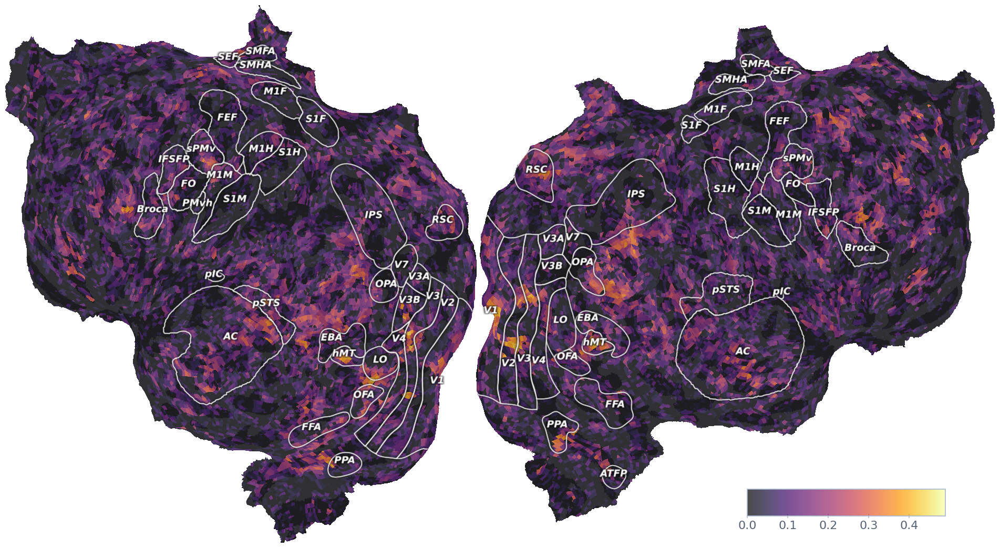

In [33]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

### Ridge

In [34]:
residual_ridge_file = os.path.join(get_result_path(modality, subject),
                                   f"residual_ridge_{low_level_feature}_english1000_scores.csv")

In [35]:
residual_ridge_scores = pd.read_csv(residual_ridge_file)
residual_ridge_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,81133.000000,80875.000000,8.113300e+04,8.087500e+04
mean,40566.000000,0.057975,7.440343e-03,3.555382e-01
std,23421.224032,0.100917,2.451416e-02,3.181051e-01
min,0.000000,-0.261461,-2.222379e-01,9.560307e-33
25%,20283.000000,-0.010079,-5.030632e-05,4.614346e-02
50%,40566.000000,0.044247,1.192093e-07,2.823037e-01
75%,60849.000000,0.110799,6.170571e-03,6.250560e-01
max,81132.000000,0.623515,3.770805e-01,9.999853e-01


In [36]:
residual_ridge_correlation = residual_ridge_scores['correlation_score']
residual_ridge_correlation = residual_ridge_correlation.to_numpy()
residual_ridge_correlation = np.nan_to_num(residual_ridge_correlation)

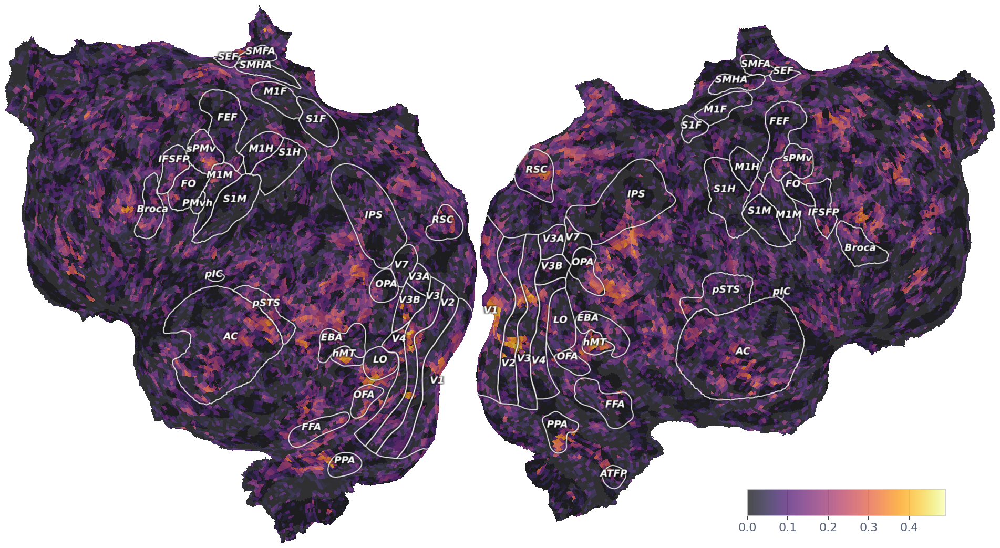

In [37]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

13


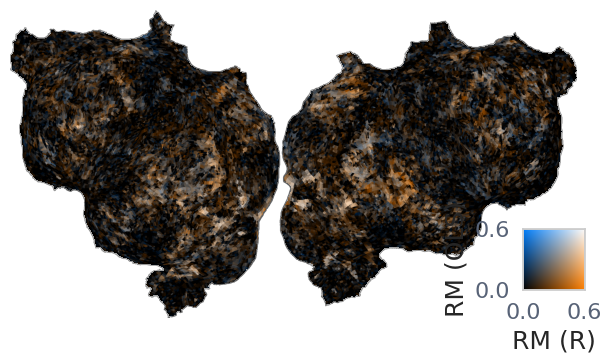

In [38]:
from matplotlib.ticker import FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(residual_ridge_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(residual_ridge_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax,
                            vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='RM (R)', label_2="RM (OLS)", ax=ax, with_rois=False,
                            colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

13


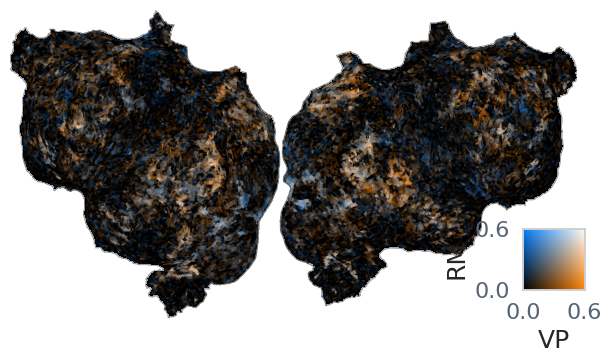

In [39]:
from matplotlib.ticker import FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(np.nan_to_num(vp_correlation).max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(vp_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='VP', label_2="RM", ax=ax, with_rois=False,
                            colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Plot visual cortex side by side

/tmp/ipykernel_13863/702089399.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


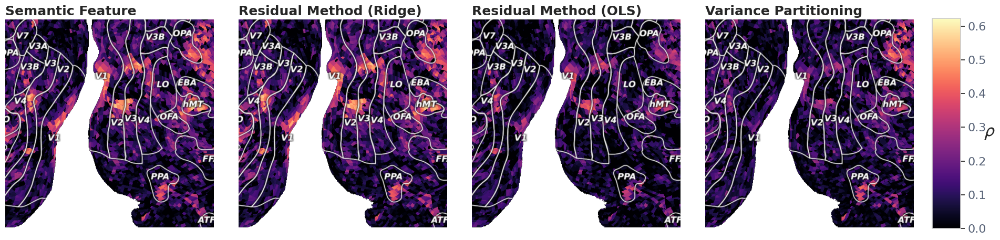

In [40]:
viewport_size = 450
fig, axs = plt.subplots(1, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

for i, (corr, name) in enumerate(
        zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
            ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
    ax = axs[i]
    ax.axis('off')
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_13863/3003999741.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


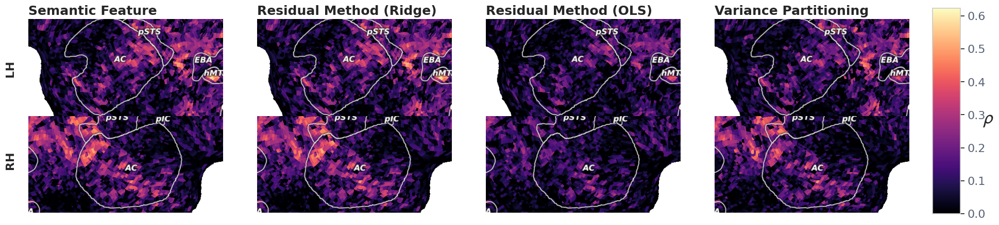

In [41]:
viewport_size = 450
fig, axs = plt.subplots(2, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(
            zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
                ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
        ax = axs[row, col]

        ax.axis('off')
        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()

# Scatterplot of visual cortex

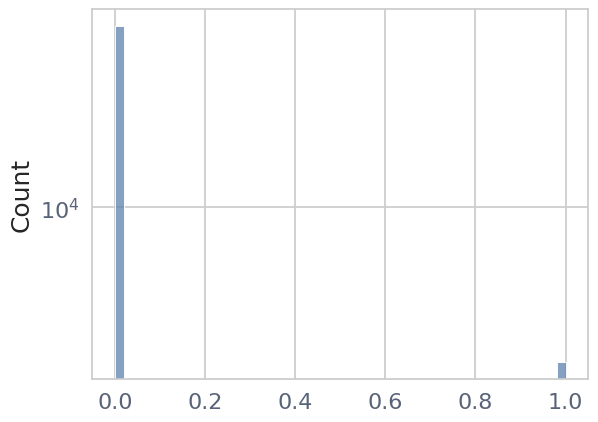

In [42]:
mapper = load_hdf5_array(mapper_path)
v1_mask = mapper['roi_mask_V1']
v2_mask = mapper['roi_mask_V2']
v3_mask = mapper['roi_mask_V3']
all_masks = v1_mask + v2_mask + v3_mask
# set all values > 0 to 1
all_masks[all_masks > 0] = 1
all_masks = all_masks.astype(bool)

sns.histplot(all_masks, kde=False, bins=50)
plt.yscale('log')

<Axes: >

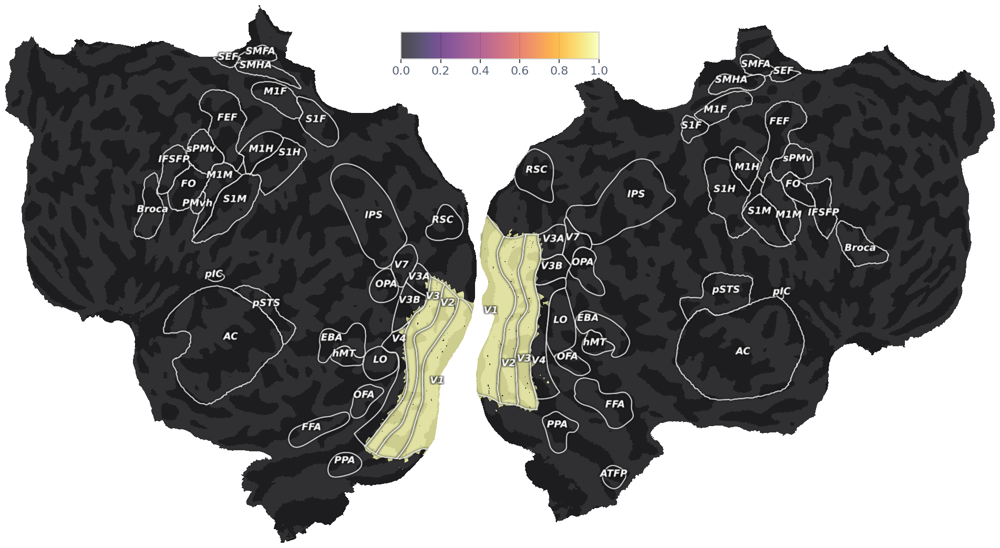

In [43]:
plot_flatmap_from_mapper(all_masks, mapper_path, vmin=0, vmax=all_masks.max())

In [44]:
# create all pairwise scatterplots in visualcorteces for semantic, variance partitioning, residual method ols and residual method ridge
data = pd.DataFrame()

visual_semantic = semantic_correlation[all_masks]
visual_rm = residual_correlation[all_masks]
visual_rm_ridge = residual_ridge_correlation[all_masks]
visual_vp = vp_correlation[all_masks]

data["Residual Method (Ridge)"] = visual_rm_ridge
data["Residual Method (OLS)"] = visual_rm
data["Variance Partitioning"] = visual_vp
data["Semantic"] = visual_semantic

In [45]:
vmax = data.max().max()
vmin = data.min().min()
print(vmin, vmax)

-0.2465145530443867 0.5538199454185598


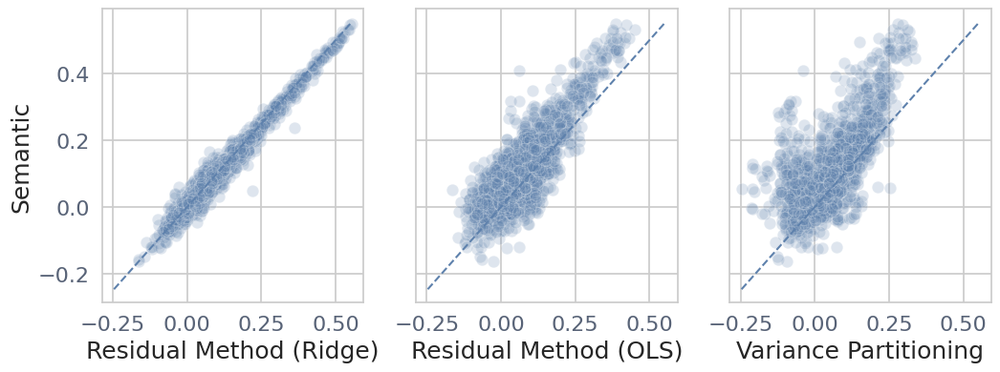

In [46]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

for ax, col in zip(axs, data.columns):
    sns.scatterplot(data, x=col, y="Semantic", ax=ax, alpha=0.2)
    sns.lineplot(x=[vmin, vmax], y=[vmin, vmax], linestyle='--', ax=ax)

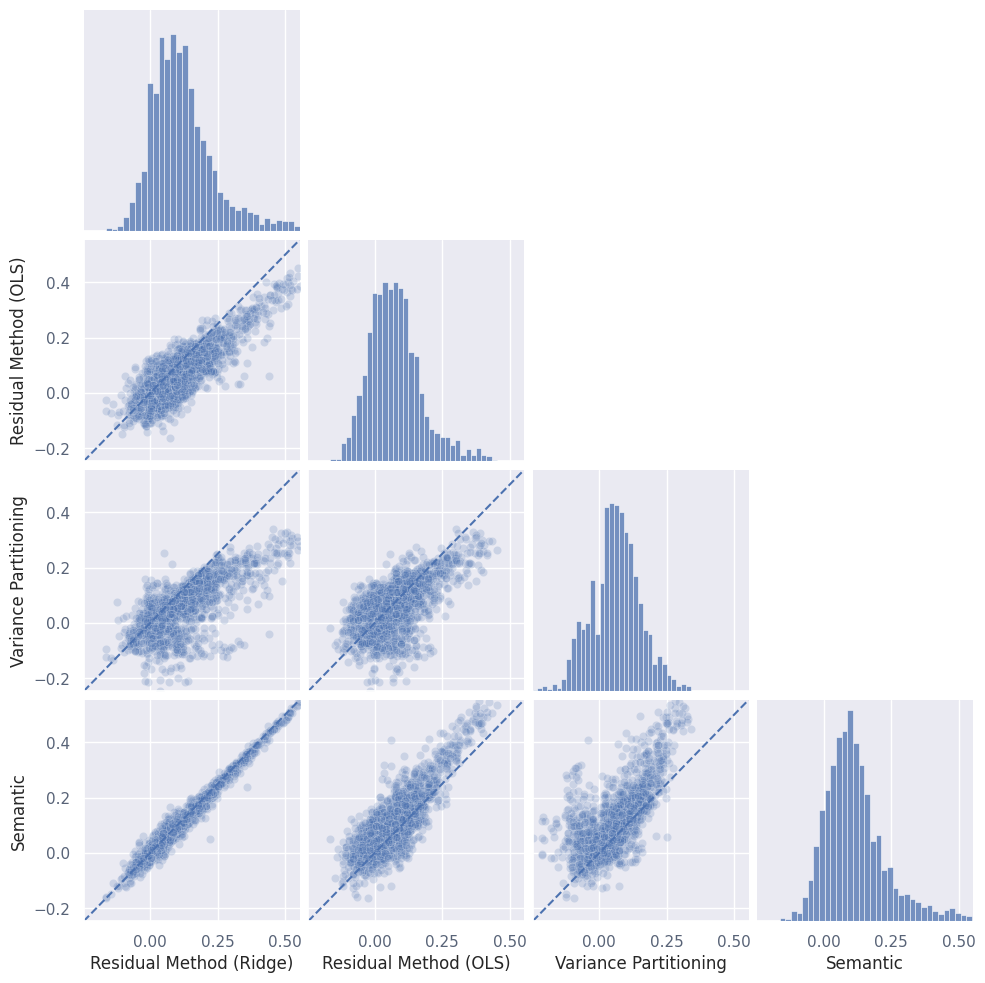

In [47]:
sns.set_theme(context='notebook')

g = sns.pairplot(data, corner=True, plot_kws=dict(alpha=0.2))

# Loop through the axes
for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        # Apply same x and y limits to all axes
        if ax is not None:
            ax.set_xlim(vmin, vmax)
            ax.set_ylim(vmin, vmax)

            if i != j:  # Only modify non-diagonal plots
                sns.lineplot(
                    x=[vmin, vmax],
                    y=[vmin, vmax],
                    ax=ax,
                    # color="red",
                    linestyle="dashed"
                )

<Axes: xlabel='Residual Method (Ridge)', ylabel='Semantic Feature'>

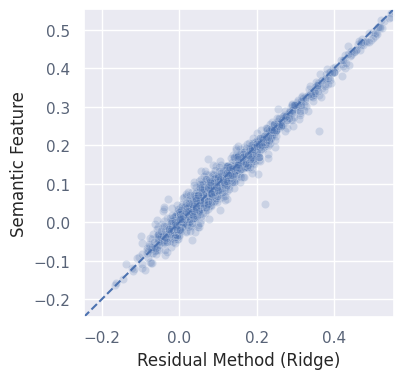

In [48]:
fig, ax = plt.subplots(figsize=(4, 4))
visual_semantic = semantic_correlation[all_masks]
visual_rm_ridge = residual_ridge_correlation[all_masks]

sns.scatterplot(x=visual_rm_ridge, y=visual_semantic, alpha=0.2)
# sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, fill=True, alpha=0.6, cmap='magma')

plt.xlabel("Residual Method (Ridge)")
plt.ylabel("Semantic Feature")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
plt.xlim([vmin, vmax])
plt.ylim([vmin, vmax])
sns.lineplot(x=[vmin, vmax], y=[vmin, vmax], linestyle="dashed")

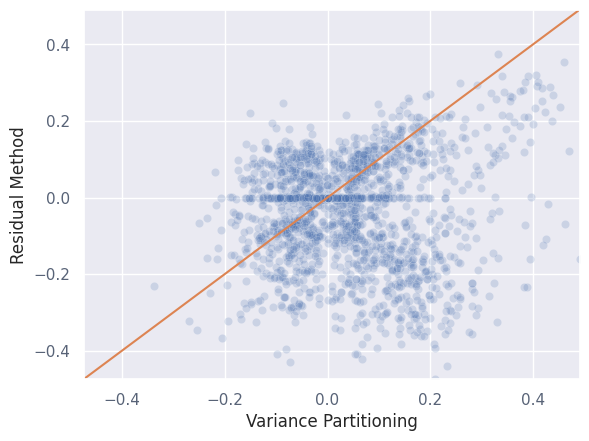

In [50]:
visual_vp = vp_scores[f'semantic\\{low_level_feature}_r2'][all_masks]
visual_rm = residual_scores['r2_score'][all_masks]
visual_vp = np.sqrt(np.abs(visual_vp)) * np.sign(visual_vp)
visual_rm = np.sqrt(np.abs(visual_rm)) * np.sign(visual_rm)
visual_vp = np.nan_to_num(visual_vp)
visual_rm = np.nan_to_num(visual_rm)

sns.scatterplot(x=visual_vp, y=visual_rm, alpha=0.2)
# sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, fill=True, alpha=0.6, cmap='magma')

plt.xlabel("Variance Partitioning")
plt.ylabel("Residual Method")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
max_lims = max(visual_rm.max(), visual_vp.max())
min_lims = min(visual_rm.min(), visual_vp.min())
plt.xlim([min_lims, max_lims])
plt.ylim([min_lims, max_lims])
plt.plot([min_lims, max_lims], [min_lims, max_lims], color='C1')

# Scatterplot of AC

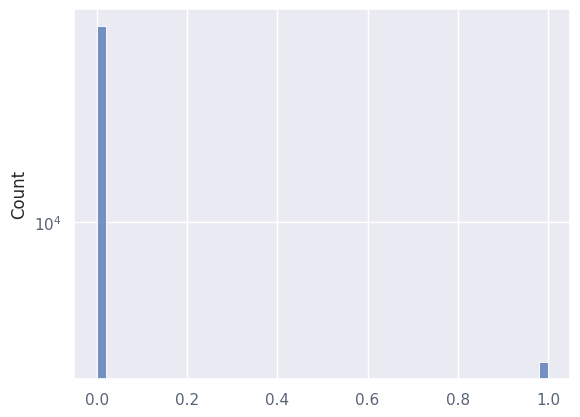

In [51]:
mapper = load_hdf5_array(mapper_path)
ac_mask = mapper['roi_mask_AC']
# set all values > 0 to 1
ac_mask[ac_mask > 0] = 1
ac_mask = ac_mask.astype(bool)

sns.histplot(ac_mask, kde=False, bins=50)
plt.yscale('log')

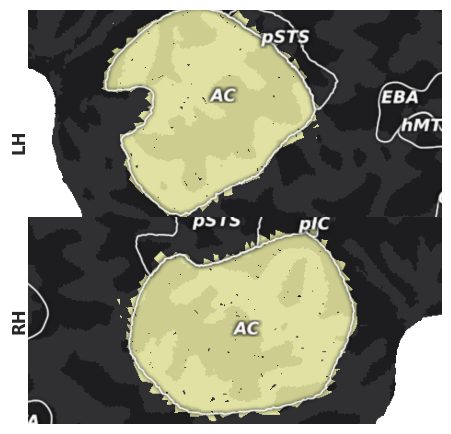

In [52]:
viewport_size = 450
fig, axs = plt.subplots(2, 1, figsize=(viewport_size / 100, viewport_size / 100))

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    ax = axs[row]
    plot_flatmap_from_mapper(ac_mask, mapper_path, vmin=0, vmax=all_masks.max(), ax=ax, with_colorbar=False)


    ax.axis('off')
    ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
    ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])


fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0)

In [53]:
# create all pairwise scatterplots in visualcorteces for semantic, variance partitioning, residual method ols and residual method ridge
data = pd.DataFrame()

auditory_semantic = semantic_correlation[ac_mask]
auditory_rm = residual_correlation[ac_mask]
auditory_rm_ridge = residual_ridge_correlation[ac_mask]
auditory_vp = vp_correlation[ac_mask]

data["Residual Method (Ridge)"] = auditory_rm_ridge
data["Residual Method (OLS)"] = auditory_rm
data["Variance Partioning"] = auditory_vp
data["Semantic"] = auditory_semantic

In [54]:
vmax = data.max().max()
vmin = data.min().min()
print(vmin, vmax)

-0.2685281095292053 0.5937178063941593


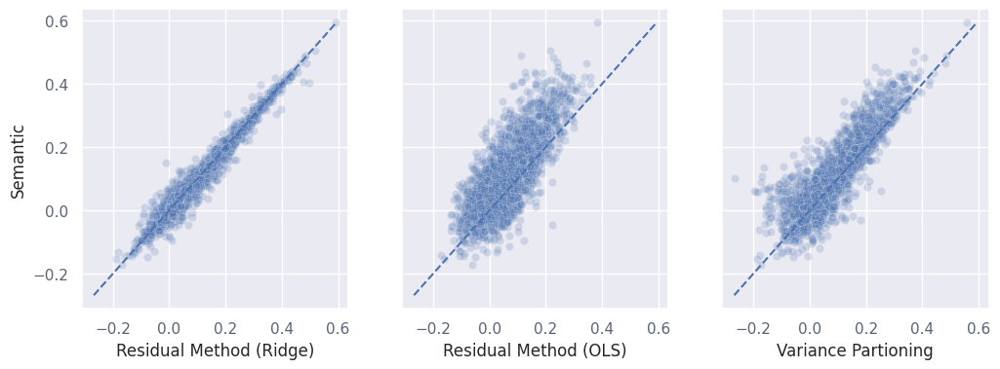

In [55]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

for ax, col in zip(axs, data.columns):
    sns.scatterplot(data, x=col, y="Semantic", ax=ax, alpha=0.2)
    sns.lineplot(x=[vmin, vmax], y=[vmin, vmax], linestyle='--', ax=ax)

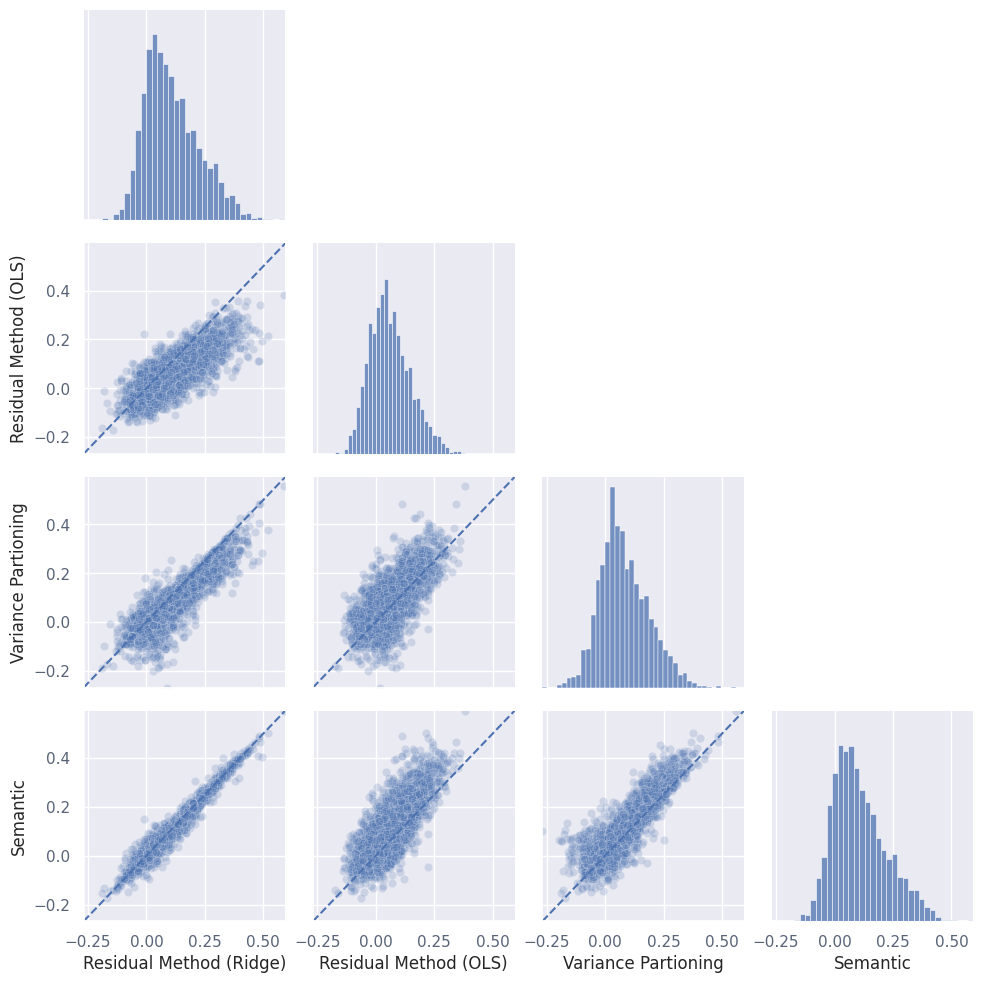

In [56]:
g = sns.pairplot(data, corner=True, plot_kws=dict(alpha=0.2))

# Loop through the axes
for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        # Apply same x and y limits to all axes
        if ax is not None:
            ax.set_xlim(vmin, vmax)
            ax.set_ylim(vmin, vmax)

            if i != j:  # Only modify non-diagonal plots
                sns.lineplot(
                    x=[vmin, vmax],
                    y=[vmin, vmax],
                    ax=ax,
                    # color="red",
                    linestyle="dashed"
                )